## Expert Knowledge Worker

### A question answering agent that is an expert knowledge worker
### To be used by employees of Insurellm, an Insurance Tech company
### The agent needs to be accurate and the solution should be low cost.

This project will use RAG (Retrieval Augmented Generation) to ensure our question/answering assistant has high accuracy.

In [1]:
# imports

import os
import glob
from dotenv import load_dotenv
import gradio as gr

In [3]:
# imports for langchain

from langchain.document_loaders import DirectoryLoader, TextLoader
from langchain.text_splitter import CharacterTextSplitter
from langchain_community.document_loaders import DirectoryLoader, TextLoader, UnstructuredWordDocumentLoader, UnstructuredExcelLoader
from langchain_community.document_loaders import UnstructuredFileLoader
from langchain.schema import Document
from langchain_openai import OpenAIEmbeddings, ChatOpenAI
from langchain_deepseek import ChatDeepSeek
from langchain_chroma import Chroma
import numpy as np
from sklearn.manifold import TSNE
import plotly.graph_objects as go
from langchain.memory import ConversationBufferMemory
from langchain.chains import ConversationalRetrievalChain

In [9]:
MODEL = "deepseek-chat"
API_URL = "https://api.deepseek.com/chat/completions"
load_dotenv(override=True)
DEEPSEEK_API_KEY = os.getenv('DEEPSEEK_API_KEY', 'sk-584f60334377408a9b2b5dd83c838142')
db_name = "vector_db"

In [16]:
# Read in documents using LangChain's loaders
# Take everything in all the sub-folders of our knowledgebase
import os
from pathlib import Path
from langchain_community.document_loaders import TextLoader

base = Path("/home/wukong/markdown")
text_loader_kwargs = {"encoding": "utf-8"}

documents = []
for path in base.rglob("*.md"):
    docs = TextLoader(str(path), **text_loader_kwargs).load()
    for d in docs:
        d.metadata["doc_type"] = path.parent.name  # folder name
        documents.append(d)


In [17]:
text_splitter = CharacterTextSplitter(chunk_size=1000, chunk_overlap=200)
chunks = text_splitter.split_documents(documents)

Created a chunk of size 1339, which is longer than the specified 1000
Created a chunk of size 1197, which is longer than the specified 1000
Created a chunk of size 1060, which is longer than the specified 1000
Created a chunk of size 1026, which is longer than the specified 1000
Created a chunk of size 1326, which is longer than the specified 1000
Created a chunk of size 1018, which is longer than the specified 1000
Created a chunk of size 1001, which is longer than the specified 1000
Created a chunk of size 1734, which is longer than the specified 1000
Created a chunk of size 1007, which is longer than the specified 1000
Created a chunk of size 1134, which is longer than the specified 1000
Created a chunk of size 1092, which is longer than the specified 1000
Created a chunk of size 1569, which is longer than the specified 1000
Created a chunk of size 1038, which is longer than the specified 1000
Created a chunk of size 1494, which is longer than the specified 1000
Created a chunk of s

In [18]:
# Put the chunks of data into a Vector Store that associates a Vector Embedding with each chunk
# Chroma is a popular open source Vector Database based on SQLLite

# embeddings = OpenAIEmbeddings()

# If you would rather use the free Vector Embeddings from HuggingFace sentence-transformers
# Then replace embeddings = OpenAIEmbeddings()
# with:
from langchain_huggingface import HuggingFaceEmbeddings
embeddings = HuggingFaceEmbeddings(model_name="sentence-transformers/all-MiniLM-L6-v2")

# Delete if already exists
if os.path.exists(db_name):
    Chroma(persist_directory=db_name, embedding_function=embeddings).delete_collection()
embeddings


HuggingFaceEmbeddings(
    model_name='sentence-transformers/all-MiniLM-L6-v2',
    cache_folder=None,
    model_kwargs={},
    encode_kwargs={},
    query_encode_kwargs={},
    multi_process=False,
    show_progress=False
)

In [20]:

# Create vectorstore
vectorstore = Chroma.from_documents(documents=chunks, embedding=embeddings, persist_directory=db_name)
print(f"Vectorstore created with {vectorstore._collection.count()} documents")

Vectorstore created with 83860 documents


In [22]:
# Get one vector and find how many dimensions it has
collection = vectorstore._collection
sample_embedding = collection.get(limit=1, include=["embeddings"])["embeddings"][0]
dimensions = len(sample_embedding)
print(f"The vectors have {dimensions:,} dimensions")

The vectors have 384 dimensions


## Visualizing the Vector Store

Let's take a minute to look at the documents and their embedding vectors to see what's going on.

In [24]:
# Prework
result = collection.get(include=['embeddings', 'documents', 'metadatas'])
vectors = np.array(result['embeddings'])
documents = result['documents']
doc_types = [metadata['doc_type'] for metadata in result['metadatas']]
doc_types


[
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    'markdown',
    '

In [26]:
colors = [['blue', 'green', 'red', 'orange'][['products', 'employees', 'contracts', 'markdown'].index(t)] for t in doc_types]

In [27]:
# We humans find it easier to visalize things in 2D!
# Reduce the dimensionality of the vectors to 2D using t-SNE
# (t-distributed stochastic neighbor embedding)

tsne = TSNE(n_components=2, random_state=42)
reduced_vectors = tsne.fit_transform(vectors)

# Create the 2D scatter plot
fig = go.Figure(data=[go.Scatter(
    x=reduced_vectors[:, 0],
    y=reduced_vectors[:, 1],
    mode='markers',
    marker=dict(size=5, color=colors, opacity=0.8),
    text=[f"Type: {t}<br>Text: {d[:100]}..." for t, d in zip(doc_types, documents)],
    hoverinfo='text'
)])

fig.update_layout(
    title='2D Chroma Vector Store Visualization',
    scene=dict(xaxis_title='x',yaxis_title='y'),
    width=800,
    height=600,
    margin=dict(r=20, b=10, l=10, t=40)
)

fig.show()

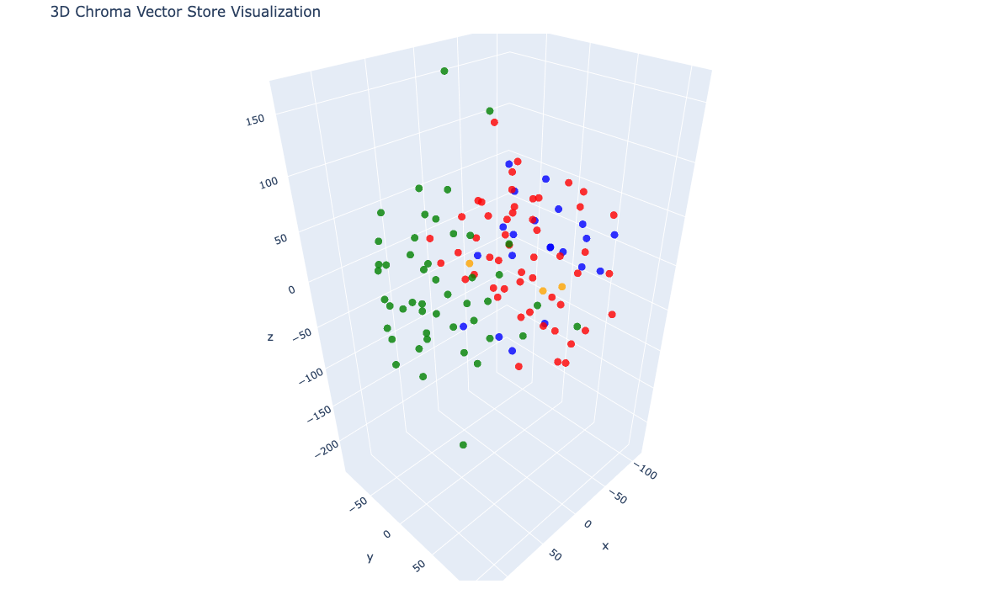

In [13]:
# Let's try 3D!

tsne = TSNE(n_components=3, random_state=42)
reduced_vectors = tsne.fit_transform(vectors)

# Create the 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=reduced_vectors[:, 0],
    y=reduced_vectors[:, 1],
    z=reduced_vectors[:, 2],
    mode='markers',
    marker=dict(size=5, color=colors, opacity=0.8),
    text=[f"Type: {t}<br>Text: {d[:100]}..." for t, d in zip(doc_types, documents)],
    hoverinfo='text'
)])

fig.update_layout(
    title='3D Chroma Vector Store Visualization',
    scene=dict(xaxis_title='x', yaxis_title='y', zaxis_title='z'),
    width=900,
    height=700,
    margin=dict(r=20, b=10, l=10, t=40)
)

fig.show()

# Time to use LangChain to bring it all together

In [28]:

llm = ChatOpenAI(
    model_name=MODEL,                 # "deepseek-chat" / "deepseek-reasoner"
    temperature=0.7,
    openai_api_base="https://api.deepseek.com/v1",
    openai_api_key=DEEPSEEK_API_KEY,
)

memory = ConversationBufferMemory(memory_key='chat_history', return_messages=True)
retriever = vectorstore.as_retriever()

conversation_chain = ConversationalRetrievalChain.from_llm(
    llm=llm,
    retriever=retriever,
    memory=memory
)

/tmp/ipykernel_39263/1897786219.py:8: LangChainDeprecationWarning:

Please see the migration guide at: https://python.langchain.com/docs/versions/migrating_memory/



In [30]:
query = "Can you describe how Cobra Extending Mamba in a few sentences"
result = conversation_chain.invoke({"question":query})
print(result["answer"])

Certainly! Cobra is a lightweight vision-language model (VLM) that extends the Mamba architecture by integrating it with a pre-trained vision encoder (like CLIP). It leverages Mamba's selective state space models (SSMs) for efficient sequential data processing while maintaining high precision (BF16 or higher) to avoid performance degradation. Cobra improves generation speed compared to existing lightweight models but faces challenges in memory optimization for mobile devices due to its sensitivity to numerical precision. The architecture consists of homogeneous Mamba blocks that process visual and textual data through gated branches, combining time-invariant and time-variant feature extraction.


In [31]:
# set up a new conversation memory for the chat
memory = ConversationBufferMemory(memory_key='chat_history', return_messages=True)

# putting it together: set up the conversation chain with the GPT 4o-mini LLM, the vector store and memory
conversation_chain = ConversationalRetrievalChain.from_llm(llm=llm, retriever=retriever, memory=memory)

## Now we will bring this up in Gradio using the Chat interface -

A quick and easy way to prototype a chat with an LLM

In [32]:
# Wrapping in a function - note that history isn't used, as the memory is in the conversation_chain

def chat(message, history):
    result = conversation_chain.invoke({"question": message})
    return result["answer"]

In [34]:
# And in Gradio:

view = gr.ChatInterface(chat).launch(inbrowser=True)

Running on local URL:  http://127.0.0.1:7860
IMPORTANT: You are using gradio version 3.50.2, however version 4.44.1 is available, please upgrade.
--------

To create a public link, set `share=True` in `launch()`.


<IPython.core.display.HTML object>